In [1]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
import seaborn as sb
import missingno as msno
import numpy as np
import seaborn as sns

import requests
from bs4 import BeautifulSoup

import numpy as np
import matplotlib.pyplot as plt
import re
import emoji

import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from textblob import TextBlob
from collections import Counter
from nltk import ngrams
from transformers import BertTokenizer, BertForSequenceClassification
from torch.nn.functional import softmax
import torch

In [2]:
etihad_airways = pd.read_csv('raw_data/etihad_airways.csv')
qatar_airways = pd.read_csv('raw_data/qatar_airways.csv')
emirates = pd.read_csv('raw_data/emirates.csv')

In [3]:
etihad_airways['airline'] = 'etihad_airways'
qatar_airways['airline'] = 'qatar_airways'
emirates['airline'] = 'emirates'

merged_df = pd.concat([etihad_airways, qatar_airways, emirates], ignore_index=True)
merged_df.head(2)

,status,author,aircraft,review_date,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,food_bev,entertainment,ground_service,wifi,value_for_money,recommended,overall,customer_review,airline
0,✅ Trip Verified,\nS Farham,NaN,1st January 2024,Family Leisure,Economy Class,Doha to Kolkata via Abu Dhabi,December 2023,3.0,5.0,3.0,3.0,1.0,NaN,3,no,5.0,I want to express my thanks to the wonderfu...,etihad_airways
1,✅ Trip Verified,\nVishal Dham,NaN,30th December 2023,Solo Leisure,Economy Class,Ahmedabad to Toronto via Abu Dhabi,December 2023,NaN,NaN,NaN,NaN,1.0,NaN,1,no,1.0,Very rude ground staff of Etihad Airways at ...,etihad_airways


In [44]:
# label

def set_labels(df):
    df['label_recommended'] = df['recommended'].map({'yes': "positive", 'no': "negative"})
    df['label_overall'] = df['overall'].apply(lambda x: 'positive' if x > 6 else ('negative' if x < 5 else 'neutral'))
    
    return df

# # preprocessing

def text_preprocessing(text):
    # Ensure that text is a Pandas Series
    if not isinstance(text, pd.Series):
        text = pd.Series(text)

    stop_words = set(stopwords.words('english'))

    result = text.str.lower()  # Lowercase text
    result = result.str.replace('\d+', '', regex=True)  # Remove numbers
    result = result.apply(lambda x: re.sub('[^a-zA-Z\s]', '', x))  # Remove punctuations
    result = result.str.strip()  # Remove whitespace
    result = result.apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))  # Remove stopwords
    result = result.apply(lambda x: ' '.join([word for word in x.split() if len(word) > 2]))  # remove words that have less than 2 letters
    result = result.apply(lambda x: emoji.demojize(x))  # Remove emoji
    
    return result

df_labeled = set_labels(merged_df)
df_processed = df_labeled.copy()
df_processed['processed_review'] = df_processed.customer_review.apply(lambda x: text_preprocessing(x))
df_processed.head(2)

,status,author,aircraft,review_date,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,...,wifi,value_for_money,recommended,overall,customer_review,airline,label_recommended,label_overall,processed_review,lemmatized_review
0,✅ Trip Verified,\nS Farham,NaN,1st January 2024,Family Leisure,Economy Class,Doha to Kolkata via Abu Dhabi,December 2023,3.0,5.0,...,NaN,3,no,5.0,I want to express my thanks to the wonderfu...,etihad_airways,negative,neutral,want express thanks wonderful crew abu dhabi k...,want express thank wonderful crew abu dhabi ko...
1,✅ Trip Verified,\nVishal Dham,NaN,30th December 2023,Solo Leisure,Economy Class,Ahmedabad to Toronto via Abu Dhabi,December 2023,NaN,NaN,...,NaN,1,no,1.0,Very rude ground staff of Etihad Airways at ...,etihad_airways,negative,negative,rude ground staff etihad airways ahmedabad air...,rude ground staff etihad airways ahmedabad air...


In [8]:
# lemmatization

import spacy

# Load the English language model in SpaCy
nlp = spacy.load('en_core_web_sm')

def text_lemmatize(text):
    doc = nlp(text)
    result = ' '.join([token.lemma_ for token in doc])
    
    return result

df_processed['lemmatized_review'] = df_processed.processed_review.apply(lambda x: text_lemmatize(x))
df_processed = df_processed.drop_duplicates(subset=['customer_review']) # drop duplicate
df_processed.head(5)

,status,author,aircraft,review_date,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,...,wifi,value_for_money,recommended,overall,customer_review,airline,label_recommended,label_overall,processed_review,lemmatized_review
0,✅ Trip Verified,\nS Farham,NaN,1st January 2024,Family Leisure,Economy Class,Doha to Kolkata via Abu Dhabi,December 2023,3.0,5.0,...,NaN,3,no,5.0,I want to express my thanks to the wonderfu...,etihad_airways,negative,neutral,want express thanks wonderful crew abu dhabi k...,want express thank wonderful crew abu dhabi ko...
1,✅ Trip Verified,\nVishal Dham,NaN,30th December 2023,Solo Leisure,Economy Class,Ahmedabad to Toronto via Abu Dhabi,December 2023,NaN,NaN,...,NaN,1,no,1.0,Very rude ground staff of Etihad Airways at ...,etihad_airways,negative,negative,rude ground staff etihad airways ahmedabad air...,rude ground staff etihad airways ahmedabad air...
2,✅ Trip Verified,\n1 reviews\n\n\n\nN Madane,A320,28th December 2023,Business,Economy Class,Abu Dhabi to Jeddah,December 2023,2.0,2.0,...,2.0,2,no,2.0,Terrible unfortunate experience. Never encou...,etihad_airways,negative,negative,terrible unfortunate experience never encounte...,terrible unfortunate experience never encounte...
3,✅ Trip Verified,\nOmar Khan,A320 / A350-1000,25th December 2023,Business,Economy Class,Riyadh to Dublin via Abu Dhabi,November 2023,3.0,5.0,...,2.0,1,no,2.0,While the in-flight service on Etihad Airway...,etihad_airways,negative,negative,inflight service etihad airways quite decent s...,inflight service etihad airway quite decent se...
4,Not Verified,\nPaul Packham,A330,21st December 2023,Couple Leisure,Business Class,Jakarta to Abu Dhabi,October 2023,1.0,3.0,...,NaN,1,no,1.0,The worst business flight I had in 2023. Des...,etihad_airways,negative,negative,worst business flight despite purchasing busin...,bad business flight despite purchase business ...


In [331]:
# remove frequent words

frequent_words = ['etihad', 'airways', 'abu', 'dhabi', 'emirate', 'dubai', 'doha', 'qatar', 'fly', 'flight', 'airline', 'new', 'york','chiang mai', 
                  'do', 'not', 'I', 've','dublin', 'bangkok', 'via', 'air', 'canada', 'hong', 'kong', 'even', 'though', 'first']
def remove_frequent_words(text):
    result = ' '.join([word for word in text.split() if word not in frequent_words])
    
    return result

df_processed['final_review'] = df_processed.lemmatized_review.apply(remove_frequent_words)
df_processed.head(5)

,status,author,aircraft,review_date,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,...,value_for_money,recommended,overall,customer_review,airline,label_recommended,label_overall,processed_review,lemmatized_review,final_review
0,✅ Trip Verified,\nS Farham,NaN,1st January 2024,Family Leisure,Economy Class,Doha to Kolkata via Abu Dhabi,December 2023,3.0,5.0,...,3,no,5.0,I want to express my thanks to the wonderfu...,etihad_airways,negative,neutral,want express thanks wonderful crew abu dhabi k...,want express thank wonderful crew abu dhabi ko...,want express thank wonderful crew kolkata espe...
1,✅ Trip Verified,\nVishal Dham,NaN,30th December 2023,Solo Leisure,Economy Class,Ahmedabad to Toronto via Abu Dhabi,December 2023,NaN,NaN,...,1,no,1.0,Very rude ground staff of Etihad Airways at ...,etihad_airways,negative,negative,rude ground staff etihad airways ahmedabad air...,rude ground staff etihad airways ahmedabad air...,rude ground staff ahmedabad airport inflight s...
2,✅ Trip Verified,\n1 reviews\n\n\n\nN Madane,A320,28th December 2023,Business,Economy Class,Abu Dhabi to Jeddah,December 2023,2.0,2.0,...,2,no,2.0,Terrible unfortunate experience. Never encou...,etihad_airways,negative,negative,terrible unfortunate experience never encounte...,terrible unfortunate experience never encounte...,terrible unfortunate experience never encounte...
3,✅ Trip Verified,\nOmar Khan,A320 / A350-1000,25th December 2023,Business,Economy Class,Riyadh to Dublin via Abu Dhabi,November 2023,3.0,5.0,...,1,no,2.0,While the in-flight service on Etihad Airway...,etihad_airways,negative,negative,inflight service etihad airways quite decent s...,inflight service etihad airway quite decent se...,inflight service airway quite decent service g...
4,Not Verified,\nPaul Packham,A330,21st December 2023,Couple Leisure,Business Class,Jakarta to Abu Dhabi,October 2023,1.0,3.0,...,1,no,1.0,The worst business flight I had in 2023. Des...,etihad_airways,negative,negative,worst business flight despite purchasing busin...,bad business flight despite purchase business ...,bad business despite purchase business class t...


### Sentiment analysis is employed to determine whether or not it performs well in product reviews.

#### VADER ((Valence Aware Dictionary and sEntiment Reasoner)
VADER does not require extensive preprocessing of text.

In [388]:
def vader_classification(df,airline):
    df_copy = df[df['airline'] == airline].copy()
    # Initialize the VADER sentiment analyzer
    nltk.download('vader_lexicon')

    analyzer = SentimentIntensityAnalyzer()

    # Add new columns for sentiment scores to the DataFrame
    df_copy['compound'] = df_copy['customer_review'].apply(lambda x: analyzer.polarity_scores(x)['compound'])
    df_copy['vader_recommended_sentiment'] = df_copy['compound'].apply(lambda x: 'positive' if x >= 0 else 'negative')
    df_copy['vader_overall_sentiment'] = df_copy['compound'].apply(lambda x: 'positive' if x > 0.5 else ('negative' if x < 0 else 'neutral'))

    return df_copy

etihad_sentimens = vader_classification(df_processed,"etihad_airways")
print(etihad_sentimens.vader_overall_sentiment.value_counts())

accuracy = accuracy_score(etihad_sentimens['label_overall'], etihad_sentimens['vader_overall_sentiment'])
print(f'Etihad Vader Accuracy: {accuracy * 100:.2f}%')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/blair/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


negative    930
positive    655
neutral     162
Name: vader_overall_sentiment, dtype: int64
Etihad Vader Accuracy: 71.72%


In [389]:
qatar_sentimens = vader_classification(df_processed,"qatar_airways")
print(qatar_sentimens.vader_overall_sentiment.value_counts())

accuracy = accuracy_score(qatar_sentimens['label_overall'], qatar_sentimens['vader_overall_sentiment'])
print(f'Qatar Vader Accuracy: {accuracy * 100:.2f}%')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/blair/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


positive    1699
negative     465
neutral      180
Name: vader_overall_sentiment, dtype: int64
Qatar Vader Accuracy: 76.02%


In [390]:
emirates_sentimens = vader_classification(df_processed,"emirates")
print(emirates_sentimens.vader_overall_sentiment.value_counts())

accuracy = accuracy_score(emirates_sentimens['label_overall'], emirates_sentimens['vader_overall_sentiment'])
print(f'Emirates Vader Accuracy: {accuracy * 100:.2f}%')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/blair/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


positive    1249
negative     890
neutral      186
Name: vader_overall_sentiment, dtype: int64
Emirates Vader Accuracy: 69.55%


### visualization

In [335]:
def plot_two_hists_comp_sns(df_1,df_2,label_1,label_2,feat,bins,title,x_label,y_label,filename):
    """
    Plot two histograms of a given feature in two different datasets.
    """
    plt.figure(figsize=(6,6))
    sns.distplot(df_1[feat],hist=True,norm_hist=True,kde=False,label=label_1,bins=bins)
    sns.distplot(df_2[feat],hist=True,norm_hist=True,kde=False,label=label_2,bins=bins)
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.grid(False)
    plt.legend(loc='best')
    plt.savefig(filename)
    plt.show()
    return

In [336]:
etihad_recommended = etihad_sentimens[etihad_sentimens['recommended']=="yes"].copy()
etihad_not_recommended = etihad_sentimens[etihad_sentimens['recommended']=="no"].copy()

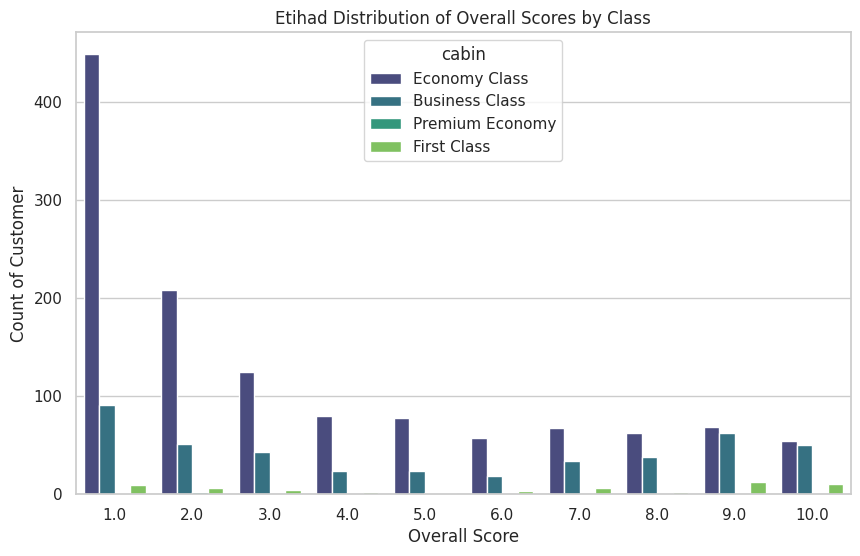

In [337]:
plt.figure(figsize=(10, 6))
sns.countplot(x='overall', hue='cabin', data=etihad_sentimens, palette='viridis')

plt.title('Etihad Distribution of Overall Scores by Class')
plt.xlabel('Overall Score')
plt.ylabel('Count of Customer')

plt.show()

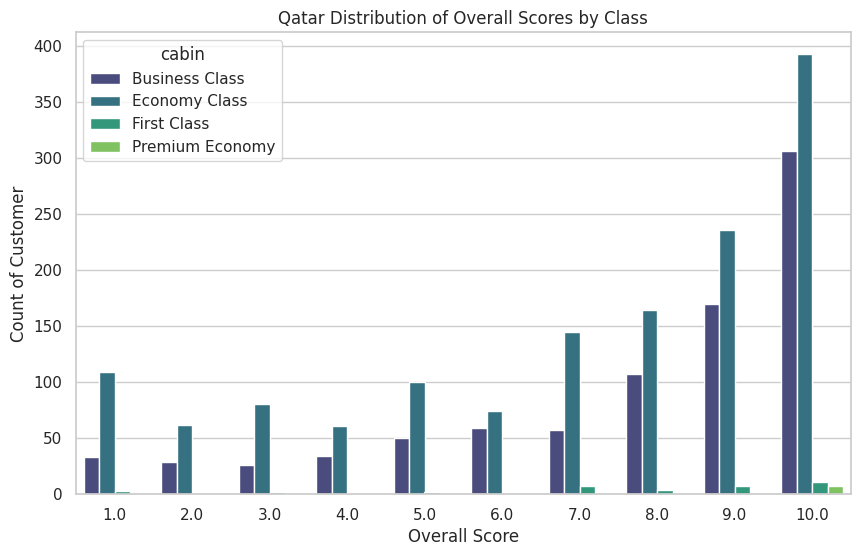

In [338]:
plt.figure(figsize=(10, 6))
sns.countplot(x='overall', hue='cabin', data=qatar_sentimens, palette='viridis')

plt.title('Qatar Distribution of Overall Scores by Class')
plt.xlabel('Overall Score')
plt.ylabel('Count of Customer')

plt.show()


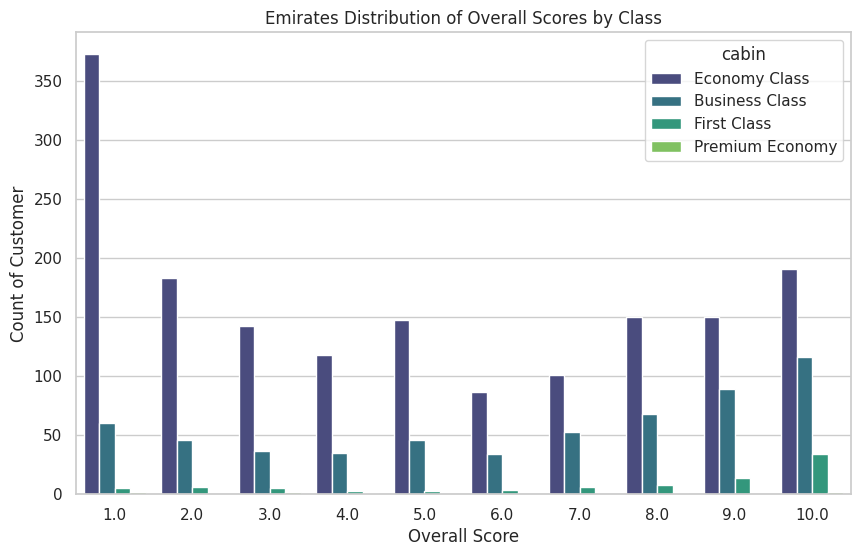

In [339]:
plt.figure(figsize=(10, 6))
sns.countplot(x='overall', hue='cabin', data=emirates_sentimens, palette='viridis')

plt.title('Emirates Distribution of Overall Scores by Class')
plt.xlabel('Overall Score')
plt.ylabel('Count of Customer')

plt.show()


/home/blair/.local/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


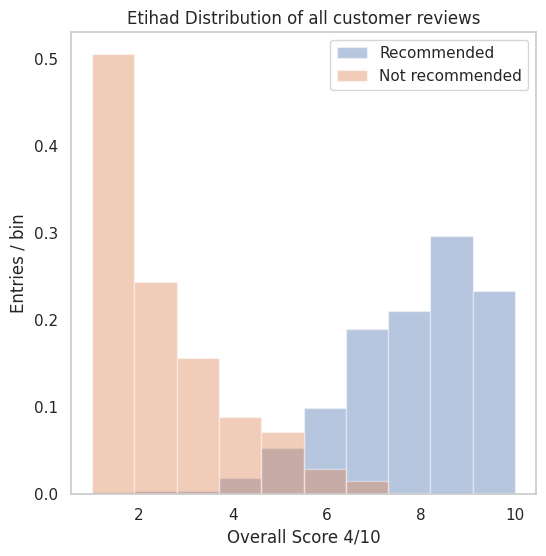

In [372]:
plot_two_hists_comp_sns(df_1=etihad_recommended,
                        df_2=etihad_not_recommended,
                        label_1='Recommended',
                        label_2='Not recommended',
                        feat='overall',
                        bins=10,
                        title='Etihad Distribution of all customer reviews',
                        x_label='Overall Score 4/10',
                        y_label='Entries / bin',
                        filename='./HistRecAndNotRec.png'
                        )

In [341]:
qatar_recommended = qatar_sentimens[qatar_sentimens['recommended']=="yes"].copy()
qatar_not_recommended = qatar_sentimens[qatar_sentimens['recommended']=="no"].copy()

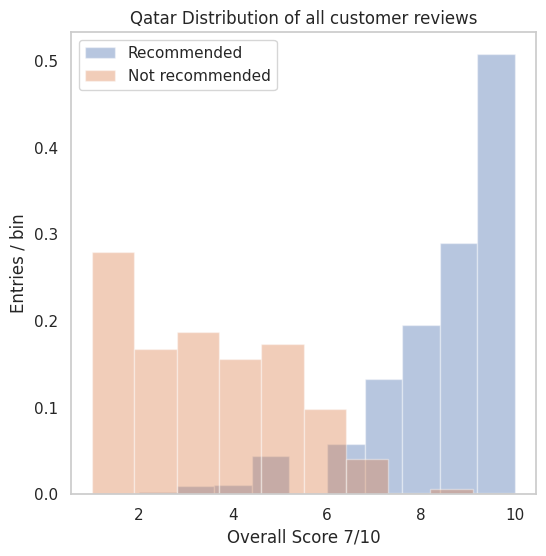

In [373]:
plot_two_hists_comp_sns(df_1=qatar_recommended,
                        df_2=qatar_not_recommended,
                        label_1='Recommended',
                        label_2='Not recommended',
                        feat='overall',
                        bins=10,
                        title='Qatar Distribution of all customer reviews',
                        x_label='Overall Score 7/10',
                        y_label='Entries / bin',
                        filename='./HistRecAndNotRec.png'
                        )

In [360]:
qatar_sentimens

,status,author,aircraft,review_date,traveller_type,cabin,route,date_flown,seat_comfort,cabin_service,...,customer_review,airline,label_recommended,label_overall,processed_review,lemmatized_review,final_review,compound,vader_recommended_sentiment,vader_overall_sentiment
1747,Not Verified,\nClive Sayers,NaN,11th January 2024,Solo Leisure,Business Class,Manchester to Adelaide via Doha,January 2024,5.0,5.0,...,"I found the cabin crew very professional, co...",qatar_airways,positive,positive,found cabin crew professional courteous proact...,find cabin crew professional courteous proacti...,find cabin crew professional courteous proacti...,0.9632,positive,positive
1748,✅ Trip Verified,\nTheo Anastasakis,A350 / Boeing 787,11th January 2024,Couple Leisure,Economy Class,Athens to Kolkata via Doha,December 2023,3.0,5.0,...,We booked and confirmed our tickets to India...,qatar_airways,positive,positive,booked confirmed tickets india months date dep...,book confirm ticket india month date departure...,book confirm ticket india month date departure...,0.9329,positive,positive
1749,✅ Trip Verified,\nLine Maria Flege,NaN,9th January 2024,Couple Leisure,Economy Class,Ho Chi Minh to Doha,January 2024,4.0,5.0,...,I flew from Ho Chi Minh friday the 5th of Jan...,qatar_airways,positive,positive,flew chi minh friday january panic attack due ...,fly chi minh friday january panic attack due f...,chi minh friday january panic attack due fit c...,0.8257,positive,positive
1750,✅ Trip Verified,\n87 reviews\n\n\n\nMichael Schade,Boeing 789 / 773,7th January 2024,Business,Business Class,Düsseldorf to Bangkok via Doha,December 2023,5.0,4.0,...,Check in at DUS airport well organized and e...,qatar_airways,positive,neutral,check dus airport well organized efficient dus...,check dus airport well organize efficient dus ...,check dus airport well organize efficient dus ...,0.5023,positive,positive
1751,✅ Trip Verified,\n1 reviews\n\n\n\nFrancesco Leonardi,Boeing 777-300,5th January 2024,Solo Leisure,Business Class,Doha to Bangkok,December 2023,1.0,3.0,...,I booked a round-trip flight from MXP to BKK...,qatar_airways,negative,negative,booked roundtrip flight mxp bkk via doh paper ...,book roundtrip flight mxp bkk via doh paper co...,book roundtrip mxp bkk doh paper comfortable c...,0.7976,positive,positive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4086,NaN,\nR Nash,NaN,12th August 2013,NaN,First Class,NaN,NaN,4.0,5.0,...,Flew first class CAI-DOH on QR503 on 8th Aug 2...,qatar_airways,positive,positive,flew first class caidoh aug qatar vip lounge c...,fly first class caidoh aug qatar vip lounge ca...,class caidoh aug vip lounge cai dump vip loung...,0.9780,positive,positive
4087,NaN,\nDavid Monteiro,NaN,6th August 2013,NaN,Economy Class,NaN,NaN,3.0,4.0,...,GVA-AUH A320. Good food but after the main mea...,qatar_airways,positive,positive,gvaauh good food main meal nothing else served...,gvaauh good food main meal nothing else serve ...,gvaauh good food main meal nothing else serve ...,0.6597,positive,positive
4088,NaN,\nGamage Champika,NaN,6th August 2013,NaN,Economy Class,NaN,NaN,3.0,3.0,...,I took a flight to London on 17th July with my...,qatar_airways,positive,positive,took flight london july year old son wife trav...,take flight london july year old son wife trav...,take london july year old son wife travel kid ...,-0.6256,negative,negative
4089,NaN,\nMartin Fernandez,NaN,6th August 2013,NaN,Economy Class,NaN,NaN,4.0,4.0,...,MAD-DOH-DXB and back. Boeing 777 in MAD-DOH se...,qatar_airways,negative,neutral,maddohdxb back boeing maddoh sectors nice spac...,maddohdxb back boeing maddoh sector nice spaci...,maddohdxb back boeing maddoh sector nice spaci...,-0.9092,negative,negative


In [343]:
emirates_recommended = emirates_sentimens[emirates_sentimens['recommended']=="yes"].copy()
emirates_not_recommended = emirates_sentimens[emirates_sentimens['recommended']=="no"].copy()

In [344]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# def plot_three_hists_comp_sns(df_1, df_2, df_3, label_1, label_2, label_3, feat, bins, title, x_label, y_label, filename):
#     plt.figure(figsize=(10, 6))
    
#     sns.histplot(df_1[feat], bins=bins, kde=False, color='blue', label=label_1)
#     sns.histplot(df_2[feat], bins=bins, kde=False, color='red', label=label_2)
#     sns.histplot(df_3[feat], bins=bins, kde=False, color='green', label=label_3)
    
#     plt.title(title)
#     plt.xlabel(x_label)
#     plt.ylabel(y_label)
#     plt.legend()
#     plt.savefig(filename)
#     plt.show()

# # Usage example
# plot_three_hists_comp_sns(df_1=emirates_recommended,
#                           df_2=emirates_not_recommended,
#                           df_3=emirates_neutral,
#                           label_1='Recommended',
#                           label_2='Not recommended',
#                           label_3='Neutral',
#                           feat='overall',
#                           bins=10,
#                           title='Emirates Distribution of all customer reviews',
#                           x_label='Overall Score',
#                           y_label='Entries / bin',
#                           filename='./HistRecAndNotRec.png')


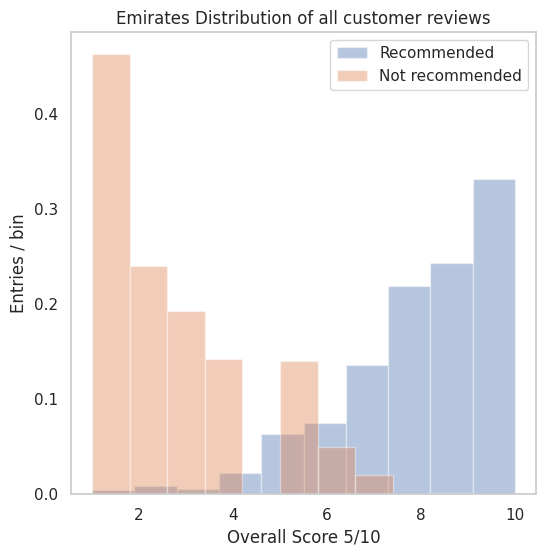

In [374]:
plot_two_hists_comp_sns(df_1=emirates_recommended,
                        df_2=emirates_not_recommended,
                        label_1='Recommended',
                        label_2='Not recommended',
                        feat='overall',
                        bins=10,
                        title='Emirates Distribution of all customer reviews',
                        x_label='Overall Score 5/10',
                        y_label='Entries / bin',
                        filename='./HistRecAndNotRec.png'
                        )

In [346]:
# # # Display the generated word cloud using Matplotlib

# from wordcloud import WordCloud
# import matplotlib.pyplot as plt

# def word_cloud(df_airline, sentiment, classification, cabin = None):
    
#     if cabin is None:
#         df = df_airline.copy()
#     else:
#         df = df_airline[df_airline['cabin'] == cabin].copy()
#     # Extract text from your DataFrame
#     text = ' '.join(df[df[sentiment] == classification]['final_review'].astype(str))
        
#     # Create a WordCloud object without specifying font_path
#     wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
#     # Display the generated word cloud using Matplotlib
#     plt.figure(figsize=(10, 5))
#     plt.imshow(wordcloud, interpolation='bilinear')
#     plt.axis('off')
#     #plt.title(f'{df_airline["airline"].unique},{sentiment},{classification},{cabin}', fontsize=16)
#     plt.show()


In [347]:
# etihad_negative_reviews = etihad_sentimens[etihad_sentimens['vader_overall_sentiment'] == 'negative']

# negative_reviews_etihad = etihad_negative_reviews['final_review']

# customer_service_reviews = [review for review in negative_reviews_etihad if 'customer service' in review.lower()]

# all_reviews_text_customer_service = ' '.join(customer_service_reviews)

In [440]:
def n_gram_wordcloud(df_airline, classification, n_grams, category=None,cabin=None):
    if cabin is None:
        df_copy = df_airline.copy()
    else:
        df_copy = df_airline[df_airline['cabin'] == cabin].copy()
        #df_copy['final_review'] = df_copy['final_review'].str.replace(cabin, '', case=False)
    df_copy = df_copy[df_copy['vader_overall_sentiment'] == classification]
    if category is not None:
        df_copy = df_copy[df_copy['final_review'].str.contains(category, case=False, na=False)]
        #df_copy['final_review'] = df_copy['final_review'].str.replace(category, '', case=False)
    text = [review for review in df_copy['final_review']]
    text = ' '.join(text)
    words = text.split()
    
    # Generate n-grams
    grams = ngrams(words,n_grams)    

    # Flatten n-grams into a list of strings
    grams_list= [' '.join(gram) for gram in grams]

    # Create a Counter to count n-gram occurrences
    grams_counter = Counter(grams_list)

    # Create a WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(grams_counter)

    # Display the WordCloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()
    
    # Get the top N most common n-grams
    top_n_grams = grams_counter.most_common(20)
    

    # Get the top N most common words
    #top_words = word_counts.most_common(20)

    # Plot the histogram
    labels, values = zip(*top_n_grams)
    plt.bar(labels, values)
    plt.xticks(rotation=45, ha="right")
    plt.xlabel('Words')
    plt.ylabel('Frequency')
    plt.title('Top 20 Most Common Words in Reviews (Stopwords Removed)')
    plt.show()

        
    return [f'{gram}: {count} occurrences' for gram, count in top_n_grams]


In [472]:
etihad_eco_negative_leg_room = etihad_eco_negative[etihad_eco_negative['final_review'].str.contains('leg room')]
etihad_eco_negative_leg_room
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_leg_room['customer_review'])

48                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     Unfortunately, our expectations for Etihad weren't met. The stewards and stewardesses were kind, this is the good point I can give. The food was okay too, but the seat leg room was inferior to other companies we took in Economy class for Japan (ANA, Swiss, etc.) I have leg problems and it was really painful. The seat ma

In [524]:
etihad_eco_negative_extertainment_screen = etihad_eco_negative[etihad_eco_negative['final_review'].str.contains('entertainment screen')]
etihad_eco_negative_extertainment_screen
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_extertainment_screen['customer_review'])

7        My wife, 2 kids (4 years and 3 months old) were flying with me from Toronto to Doha. They were on a separate booking than me, so I paid extra money to have seats next to them. I paid for extra legroom seats at 23C aisle seat. The staff had moved my wife and kids away from row 23 and moved them to row 43. When I asked them to put them back on the seats we had selected in row 23 by calling Etihad airways customer service, they refused. As such they changed my seat to row 45 which did not have extra legroom and was a middle seat. Etihad went about boarding in Toronto with business first zone 1, 2, 3 and then came to us. I asked a few times that with children long lines are difficult for them, is there a family line and I was told there was none. We had four carry on for all four of us and had put it in the seats above us. While re-arranging others bags, the flight attendant whose bag is this to which I said it was mine. She took it out and gave it to me and said we have to put ot

In [572]:
etihad_eco_negative_pay_extra = etihad_eco_negative[etihad_eco_negative['final_review'].str.contains('pay extra')]
etihad_eco_negative_pay_extra
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_pay_extra['customer_review'])

7                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           My wife, 2 kids (4 years and 3 months old) were flying with me from Toronto to Doha. They were on a separate booking than me, so I paid extra money to have seats next to them. I paid for extra legroom seats at 23C aisle seat. The staff had moved my wife and kids away from row 23 and 

In [576]:
etihad_eco_negative_leg_room = etihad_eco_negative_low_seat_comfort[etihad_eco_negative_low_seat_comfort['final_review'].str.contains('narrow')]
etihad_eco_negative_leg_room
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_leg_room['customer_review'])

92                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

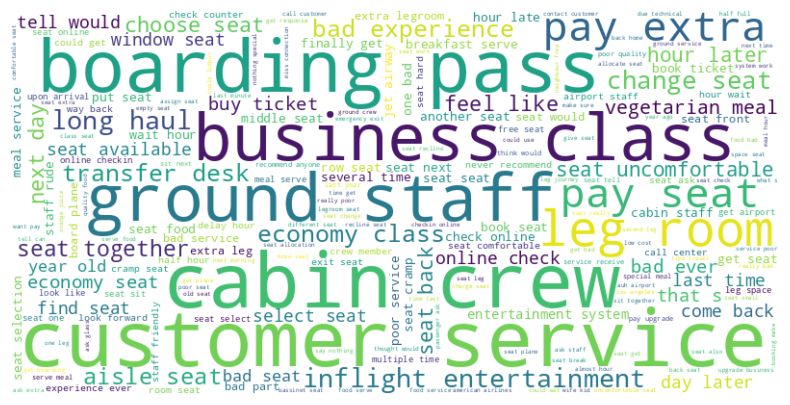

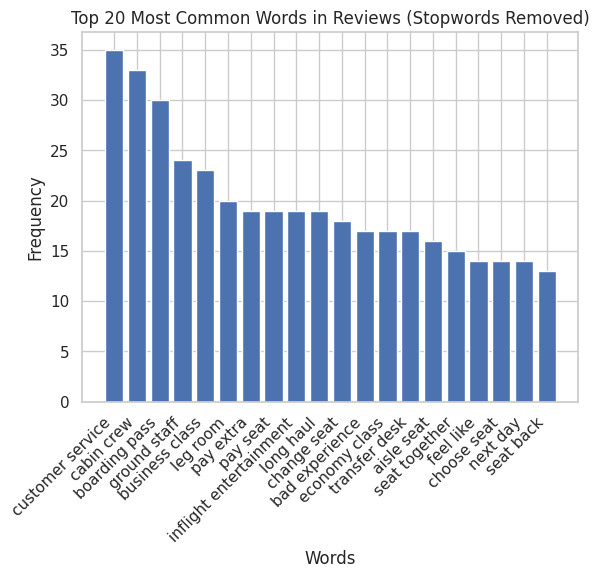

['customer service: 35 occurrences',
 'cabin crew: 33 occurrences',
 'boarding pass: 30 occurrences',
 'ground staff: 24 occurrences',
 'business class: 23 occurrences',
 'leg room: 20 occurrences',
 'pay extra: 19 occurrences',
 'pay seat: 19 occurrences',
 'inflight entertainment: 19 occurrences',
 'long haul: 19 occurrences',
 'change seat: 18 occurrences',
 'bad experience: 17 occurrences',
 'economy class: 17 occurrences',
 'transfer desk: 17 occurrences',
 'aisle seat: 16 occurrences',
 'seat together: 15 occurrences',
 'feel like: 14 occurrences',
 'choose seat: 14 occurrences',
 'next day: 14 occurrences',
 'seat back: 13 occurrences']

In [444]:
etihad_eco_negative = etihad_sentimens[(etihad_sentimens['label_overall'] == 'negative') & 
                (etihad_sentimens['vader_overall_sentiment'] == 'negative') & (etihad_sentimens['cabin'] == 'Economy Class')]


n_gram_wordcloud(df_airline=etihad_eco_negative, classification='negative', n_grams=2,category="seat",cabin=None)

In [480]:
qatar_eco_positive_seat_comfort = qatar_eco_positive[qatar_eco_positive['final_review'].str.contains('seat comfortable')]
qatar_eco_positive_seat_comfort
pd.set_option('display.max_colwidth', None)
print(qatar_eco_positive_seat_comfort['customer_review'])

1806                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

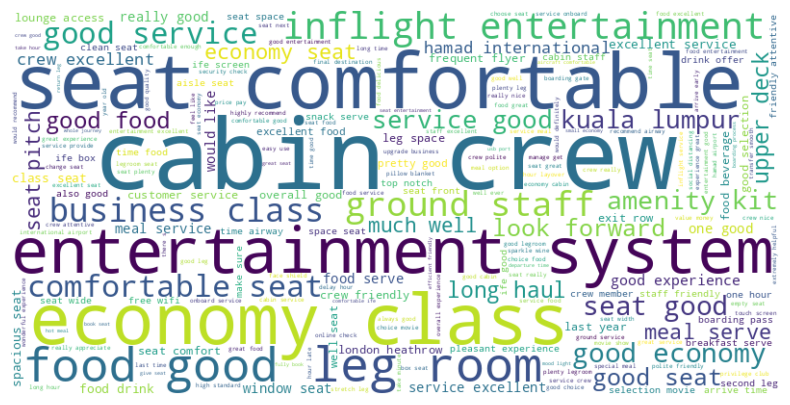

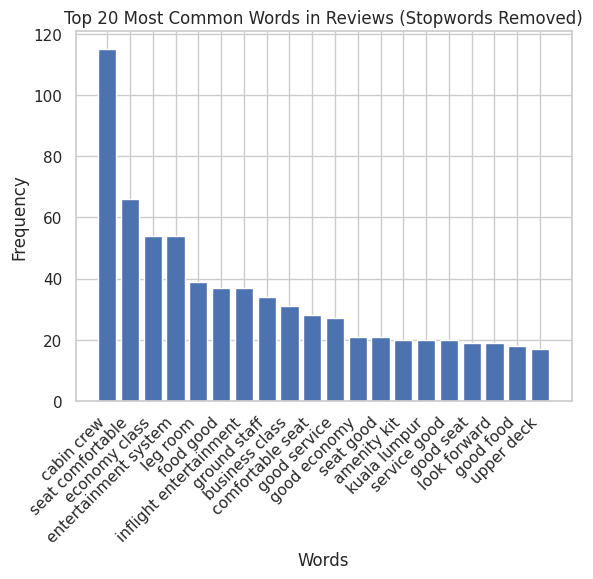

['cabin crew: 115 occurrences',
 'seat comfortable: 66 occurrences',
 'economy class: 54 occurrences',
 'entertainment system: 54 occurrences',
 'leg room: 39 occurrences',
 'food good: 37 occurrences',
 'inflight entertainment: 37 occurrences',
 'ground staff: 34 occurrences',
 'business class: 31 occurrences',
 'comfortable seat: 28 occurrences',
 'good service: 27 occurrences',
 'good economy: 21 occurrences',
 'seat good: 21 occurrences',
 'amenity kit: 20 occurrences',
 'kuala lumpur: 20 occurrences',
 'service good: 20 occurrences',
 'good seat: 19 occurrences',
 'look forward: 19 occurrences',
 'good food: 18 occurrences',
 'upper deck: 17 occurrences']

In [478]:
qatar_eco_positive_high_seat_comfort = qatar_eco_positive[qatar_eco_positive['seat_comfort']>3]
n_gram_wordcloud(df_airline = qatar_eco_positive_high_seat_comfort,classification = "positive", n_grams=2, 
                 category="seat",cabin="Economy Class")

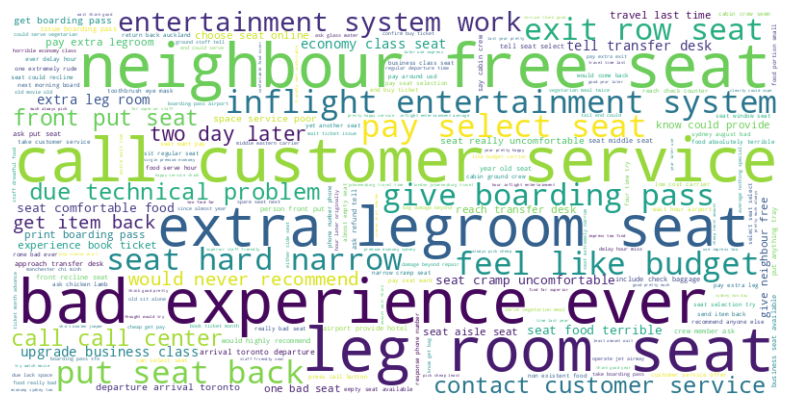

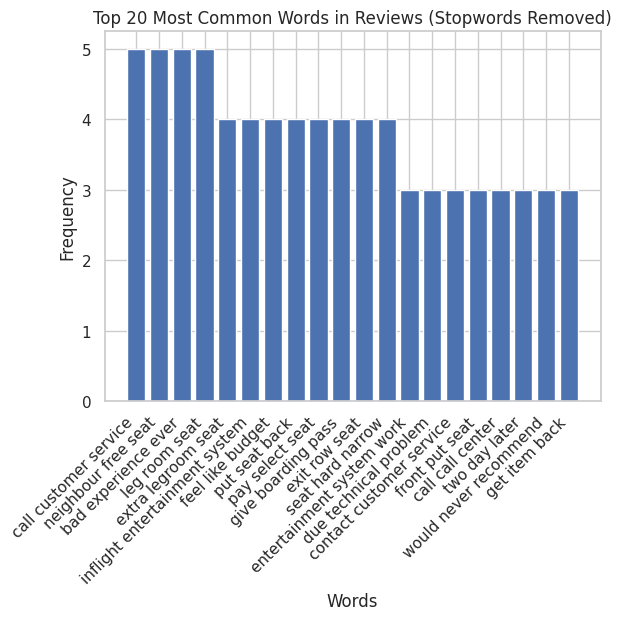

['call customer service: 5 occurrences',
 'neighbour free seat: 5 occurrences',
 'bad experience ever: 5 occurrences',
 'leg room seat: 5 occurrences',
 'extra legroom seat: 4 occurrences',
 'inflight entertainment system: 4 occurrences',
 'feel like budget: 4 occurrences',
 'put seat back: 4 occurrences',
 'pay select seat: 4 occurrences',
 'give boarding pass: 4 occurrences',
 'exit row seat: 4 occurrences',
 'seat hard narrow: 4 occurrences',
 'entertainment system work: 3 occurrences',
 'due technical problem: 3 occurrences',
 'contact customer service: 3 occurrences',
 'front put seat: 3 occurrences',
 'call call center: 3 occurrences',
 'two day later: 3 occurrences',
 'would never recommend: 3 occurrences',
 'get item back: 3 occurrences']

In [570]:
etihad_eco_negative_low_seat_comfort = etihad_eco_negative[etihad_eco_negative['seat_comfort']<3]
n_gram_wordcloud(df_airline = etihad_eco_negative_low_seat_comfort,classification = "negative", n_grams=3, 
                 category="seat",cabin="Economy Class")

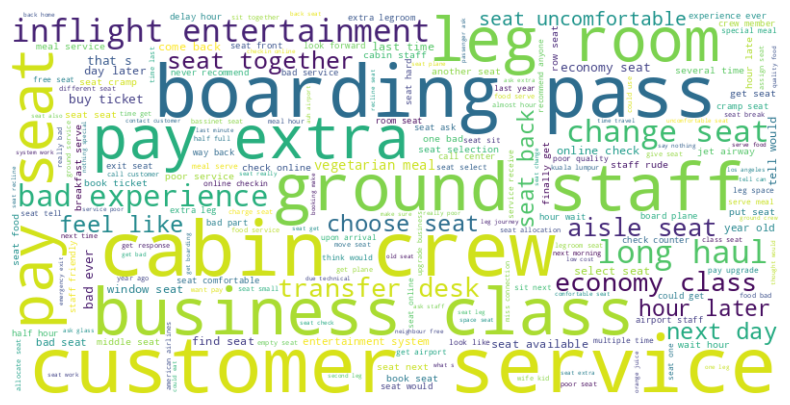

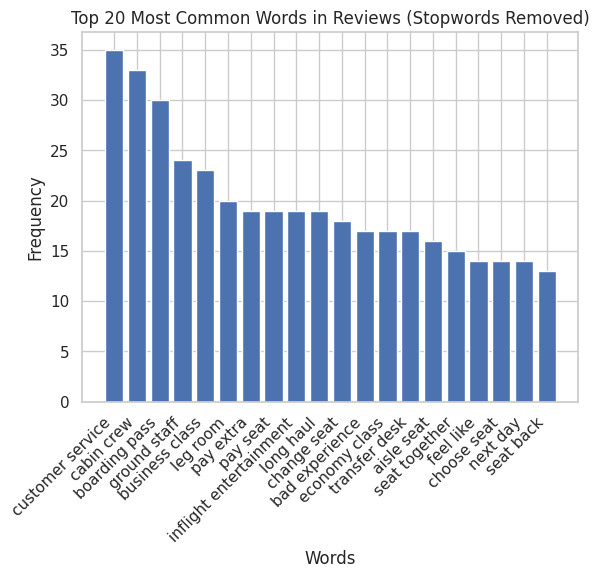

['customer service: 35 occurrences',
 'cabin crew: 33 occurrences',
 'boarding pass: 30 occurrences',
 'ground staff: 24 occurrences',
 'business class: 23 occurrences',
 'leg room: 20 occurrences',
 'pay extra: 19 occurrences',
 'pay seat: 19 occurrences',
 'inflight entertainment: 19 occurrences',
 'long haul: 19 occurrences',
 'change seat: 18 occurrences',
 'bad experience: 17 occurrences',
 'economy class: 17 occurrences',
 'transfer desk: 17 occurrences',
 'aisle seat: 16 occurrences',
 'seat together: 15 occurrences',
 'feel like: 14 occurrences',
 'choose seat: 14 occurrences',
 'next day: 14 occurrences',
 'seat back: 13 occurrences']

In [452]:
n_gram_wordcloud(df_airline = etihad_eco_negative,classification = "negative", n_grams=2, 
                 category="seat",cabin="Economy Class")

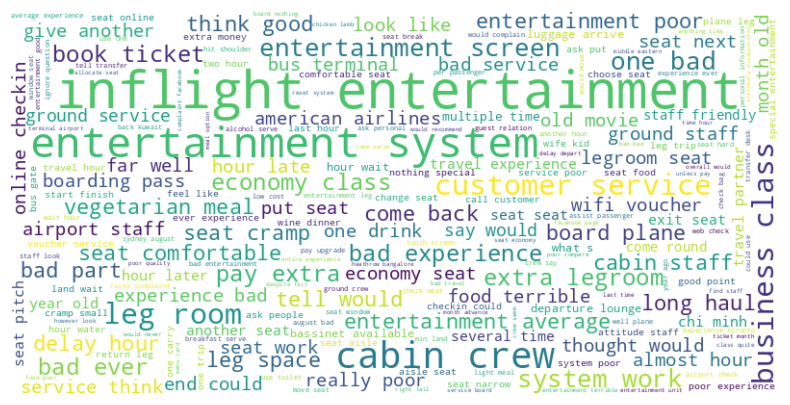

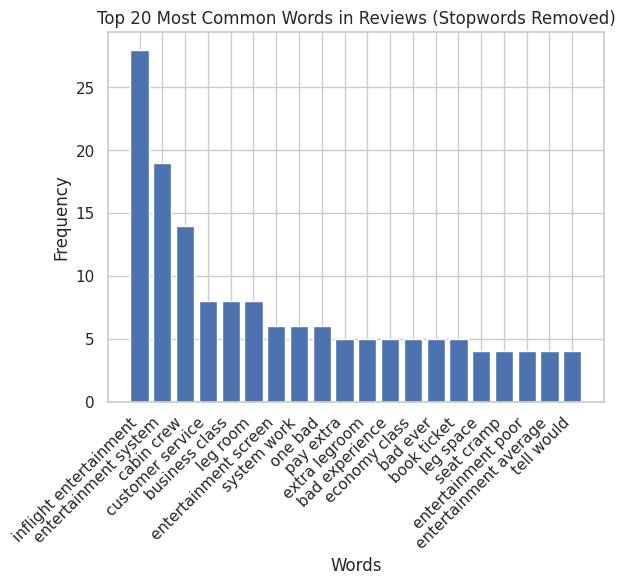

['inflight entertainment: 28 occurrences',
 'entertainment system: 19 occurrences',
 'cabin crew: 14 occurrences',
 'customer service: 8 occurrences',
 'business class: 8 occurrences',
 'leg room: 8 occurrences',
 'entertainment screen: 6 occurrences',
 'system work: 6 occurrences',
 'one bad: 6 occurrences',
 'pay extra: 5 occurrences',
 'extra legroom: 5 occurrences',
 'bad experience: 5 occurrences',
 'economy class: 5 occurrences',
 'bad ever: 5 occurrences',
 'book ticket: 5 occurrences',
 'leg space: 4 occurrences',
 'seat cramp: 4 occurrences',
 'entertainment poor: 4 occurrences',
 'entertainment average: 4 occurrences',
 'tell would: 4 occurrences']

In [523]:
etihad_eco_negative_low_entertainment = etihad_eco_negative[etihad_eco_negative['entertainment']<3]
n_gram_wordcloud(df_airline = etihad_eco_negative,classification = "negative", n_grams=2, 
                 category="entertainment",cabin="Economy Class")

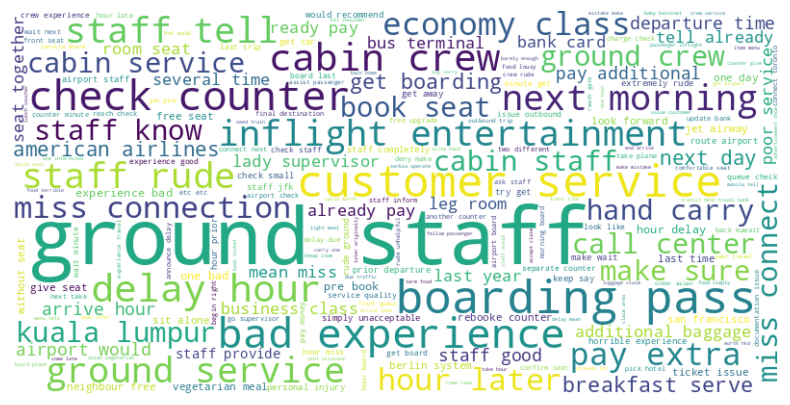

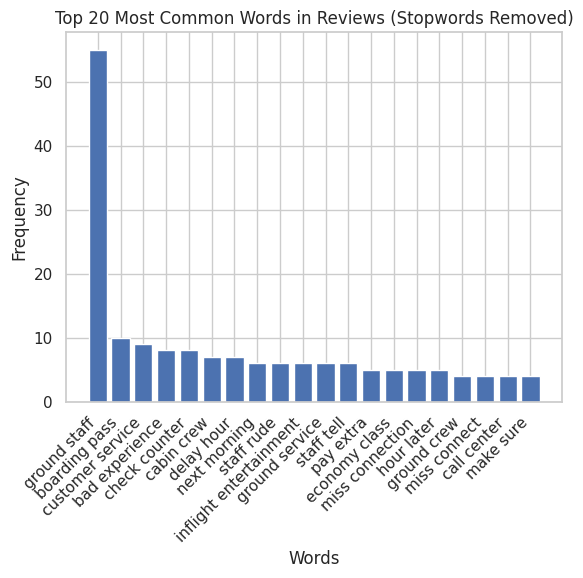

['ground staff: 55 occurrences',
 'boarding pass: 10 occurrences',
 'customer service: 9 occurrences',
 'bad experience: 8 occurrences',
 'check counter: 8 occurrences',
 'cabin crew: 7 occurrences',
 'delay hour: 7 occurrences',
 'next morning: 6 occurrences',
 'staff rude: 6 occurrences',
 'inflight entertainment: 6 occurrences',
 'ground service: 6 occurrences',
 'staff tell: 6 occurrences',
 'pay extra: 5 occurrences',
 'economy class: 5 occurrences',
 'miss connection: 5 occurrences',
 'hour later: 5 occurrences',
 'ground crew: 4 occurrences',
 'miss connect: 4 occurrences',
 'call center: 4 occurrences',
 'make sure: 4 occurrences']

In [528]:
etihad_eco_negative_low_ground_service = etihad_eco_negative[etihad_eco_negative['ground_service']<3]
n_gram_wordcloud(df_airline = etihad_eco_negative_low_ground_service,classification = "negative", n_grams=2, 
                 category="ground",cabin="Economy Class")

In [530]:
etihad_eco_negative_boarding_pass = etihad_eco_negative_low_ground_service[etihad_eco_negative_low_ground_service['final_review'].str.contains('ground staff')]
etihad_eco_negative_boarding_pass
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_boarding_pass['customer_review'])

1                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [529]:
etihad_eco_negative_boarding_pass = etihad_eco_negative_low_ground_service[etihad_eco_negative_low_ground_service['final_review'].str.contains('boarding pass')]
etihad_eco_negative_boarding_pass
pd.set_option('display.max_colwidth', None)
print(etihad_eco_negative_boarding_pass['customer_review'])

7                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

### Combination method

### Emirates

#### negative

In [546]:
emirates_eco_negative = emirates_sentimens[(emirates_sentimens['label_overall'] == 'negative') & 
                    (emirates_sentimens['vader_overall_sentiment'] == 'negative') & (emirates_sentimens['cabin'] == 'Economy Class')]

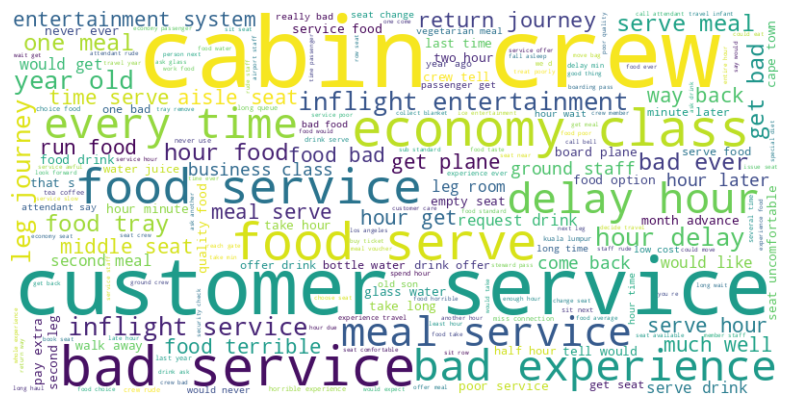

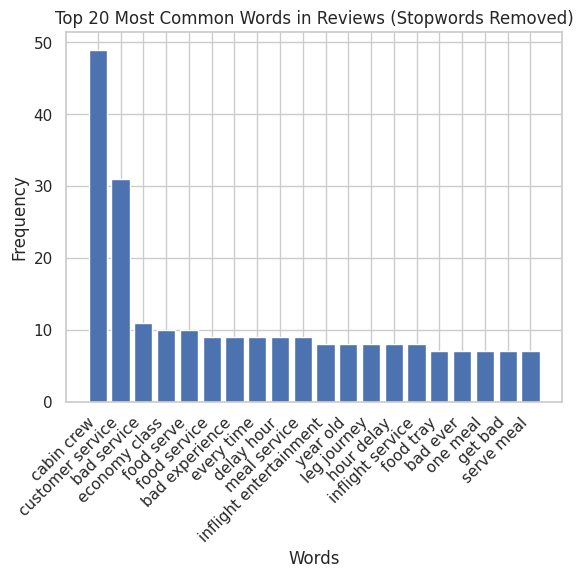

['cabin crew: 49 occurrences',
 'customer service: 31 occurrences',
 'bad service: 11 occurrences',
 'economy class: 10 occurrences',
 'food serve: 10 occurrences',
 'food service: 9 occurrences',
 'bad experience: 9 occurrences',
 'every time: 9 occurrences',
 'delay hour: 9 occurrences',
 'meal service: 9 occurrences',
 'inflight entertainment: 8 occurrences',
 'year old: 8 occurrences',
 'leg journey: 8 occurrences',
 'hour delay: 8 occurrences',
 'inflight service: 8 occurrences',
 'food tray: 7 occurrences',
 'bad ever: 7 occurrences',
 'one meal: 7 occurrences',
 'get bad: 7 occurrences',
 'serve meal: 7 occurrences']

In [548]:
emirates_eco_negative_low_food_bev = emirates_eco_negative[emirates_eco_negative['food_bev']<3]
n_gram_wordcloud(df_airline = emirates_eco_negative_low_food_bev,classification = "negative", n_grams=2, 
                 category="food",cabin="Economy Class")

In [549]:
emirates_eco_negative_low_meal = emirates_eco_negative_low_food_bev[emirates_eco_negative_low_food_bev['final_review'].str.contains('meal')]
emirates_eco_negative_low_meal
pd.set_option('display.max_colwidth', None)
print(emirates_eco_negative_low_meal['customer_review'])

4101                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

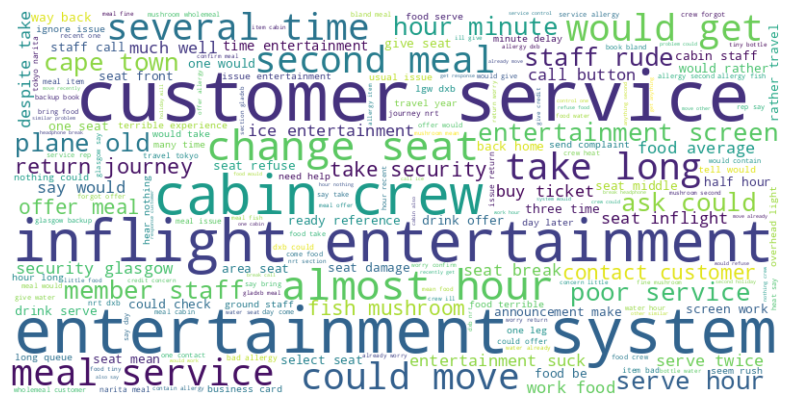

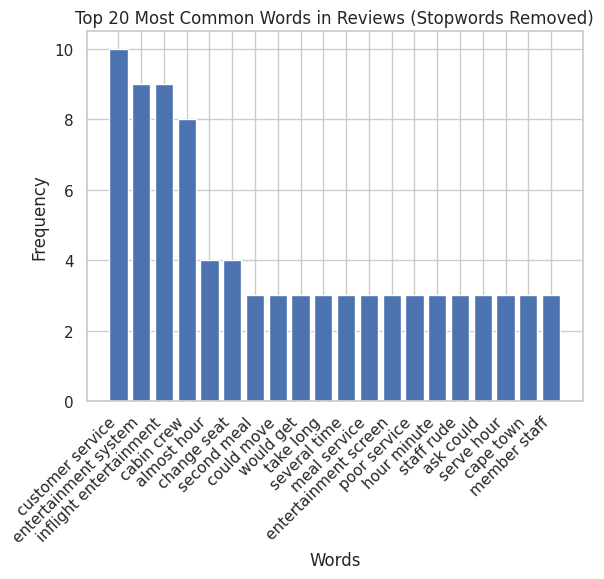

['customer service: 10 occurrences',
 'entertainment system: 9 occurrences',
 'inflight entertainment: 9 occurrences',
 'cabin crew: 8 occurrences',
 'almost hour: 4 occurrences',
 'change seat: 4 occurrences',
 'second meal: 3 occurrences',
 'could move: 3 occurrences',
 'would get: 3 occurrences',
 'take long: 3 occurrences',
 'several time: 3 occurrences',
 'meal service: 3 occurrences',
 'entertainment screen: 3 occurrences',
 'poor service: 3 occurrences',
 'hour minute: 3 occurrences',
 'staff rude: 3 occurrences',
 'ask could: 3 occurrences',
 'serve hour: 3 occurrences',
 'cape town: 3 occurrences',
 'member staff: 3 occurrences']

In [556]:
emirates_eco_negative_low_entertainment = emirates_eco_negative[emirates_eco_negative['entertainment']<3]
n_gram_wordcloud(df_airline = emirates_eco_negative_low_entertainment,classification = "negative", n_grams=2, 
                 category="entertainment",cabin="Economy Class")

In [557]:
emirates_eco_negative_low_ent = emirates_eco_negative_low_entertainment[emirates_eco_negative_low_entertainment['final_review'].str.contains('entertainment')]
emirates_eco_negative_low_ent
pd.set_option('display.max_colwidth', None)
print(emirates_eco_negative_low_ent['customer_review'])

4101                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

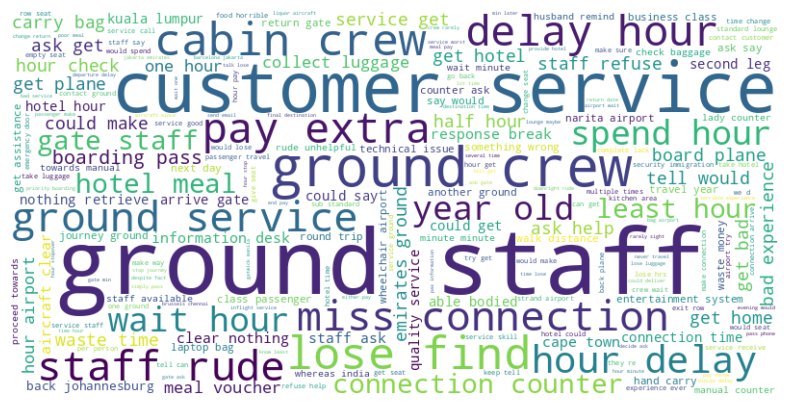

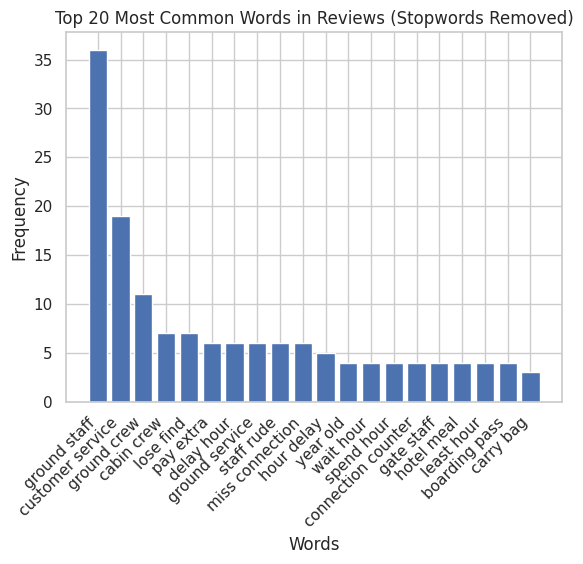

['ground staff: 36 occurrences',
 'customer service: 19 occurrences',
 'ground crew: 11 occurrences',
 'cabin crew: 7 occurrences',
 'lose find: 7 occurrences',
 'pay extra: 6 occurrences',
 'delay hour: 6 occurrences',
 'ground service: 6 occurrences',
 'staff rude: 6 occurrences',
 'miss connection: 6 occurrences',
 'hour delay: 5 occurrences',
 'year old: 4 occurrences',
 'wait hour: 4 occurrences',
 'spend hour: 4 occurrences',
 'connection counter: 4 occurrences',
 'gate staff: 4 occurrences',
 'hotel meal: 4 occurrences',
 'least hour: 4 occurrences',
 'boarding pass: 4 occurrences',
 'carry bag: 3 occurrences']

In [561]:
emirates_eco_negative_low_eground_service = emirates_eco_negative[emirates_eco_negative['ground_service']<3]
n_gram_wordcloud(df_airline = emirates_eco_negative_low_eground_service,classification = "negative", n_grams=2, 
                 category="ground",cabin="Economy Class")

In [563]:
emirates_eco_negative_low_ground_staff = emirates_eco_negative_low_eground_service[emirates_eco_negative_low_eground_service['final_review'].str.contains('ground staff')]
emirates_eco_negative_low_ground_staff
pd.set_option('display.max_colwidth', None)
print(emirates_eco_negative_low_ground_staff['customer_review'])

4186                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

#### positive

In [551]:
emirates_eco_positive = emirates_sentimens[(emirates_sentimens['label_overall'] == 'positive') & 
                    (emirates_sentimens['vader_overall_sentiment'] == 'positive') & (emirates_sentimens['cabin'] == 'Economy Class')]

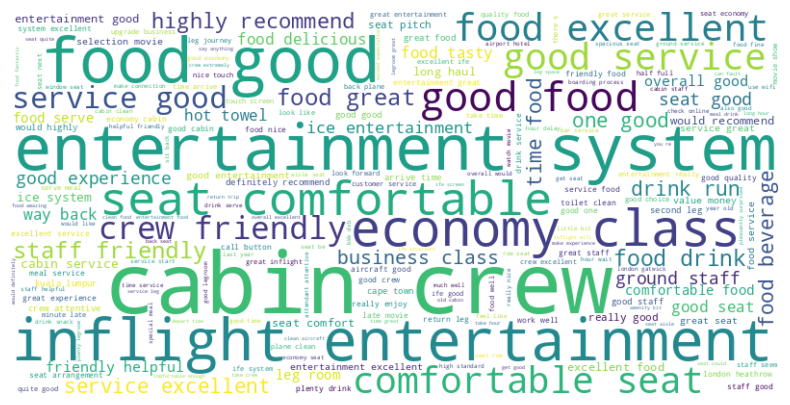

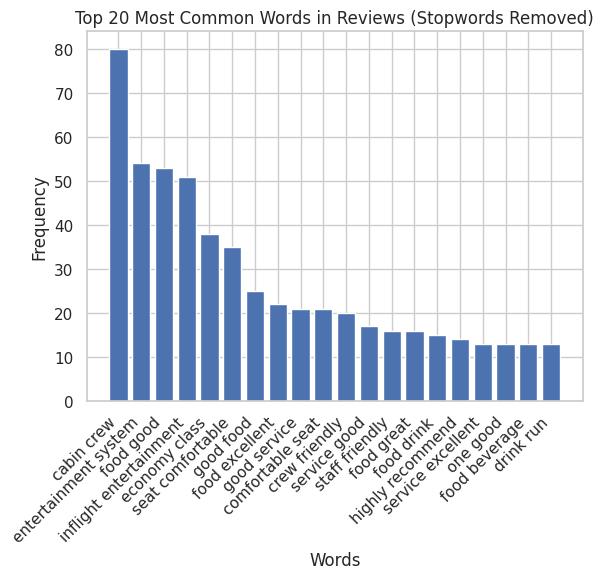

['cabin crew: 80 occurrences',
 'entertainment system: 54 occurrences',
 'food good: 53 occurrences',
 'inflight entertainment: 51 occurrences',
 'economy class: 38 occurrences',
 'seat comfortable: 35 occurrences',
 'good food: 25 occurrences',
 'food excellent: 22 occurrences',
 'good service: 21 occurrences',
 'comfortable seat: 21 occurrences',
 'crew friendly: 20 occurrences',
 'service good: 17 occurrences',
 'staff friendly: 16 occurrences',
 'food great: 16 occurrences',
 'food drink: 15 occurrences',
 'highly recommend: 14 occurrences',
 'service excellent: 13 occurrences',
 'one good: 13 occurrences',
 'food beverage: 13 occurrences',
 'drink run: 13 occurrences']

In [553]:
emirates_eco_positive_high_food_bev = emirates_eco_positive[emirates_eco_positive['food_bev']>3]
n_gram_wordcloud(df_airline = emirates_eco_positive_high_food_bev,classification = "positive", n_grams=2, 
                 category="food",cabin="Economy Class")

In [555]:
emirates_eco_positive_good_food = emirates_eco_positive_high_food_bev[emirates_eco_positive_high_food_bev['final_review'].str.contains('good food')]
emirates_eco_positive_good_food
pd.set_option('display.max_colwidth', None)
print(emirates_eco_positive_good_food['customer_review'])

4201                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

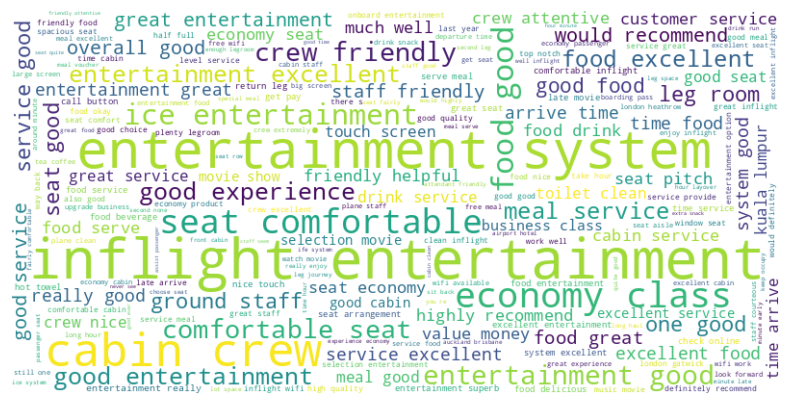

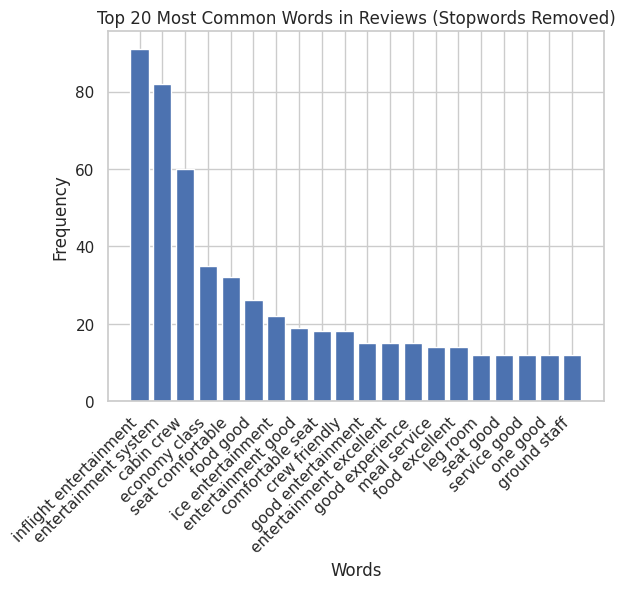

['inflight entertainment: 91 occurrences',
 'entertainment system: 82 occurrences',
 'cabin crew: 60 occurrences',
 'economy class: 35 occurrences',
 'seat comfortable: 32 occurrences',
 'food good: 26 occurrences',
 'ice entertainment: 22 occurrences',
 'entertainment good: 19 occurrences',
 'comfortable seat: 18 occurrences',
 'crew friendly: 18 occurrences',
 'good entertainment: 15 occurrences',
 'entertainment excellent: 15 occurrences',
 'good experience: 15 occurrences',
 'meal service: 14 occurrences',
 'food excellent: 14 occurrences',
 'leg room: 12 occurrences',
 'seat good: 12 occurrences',
 'service good: 12 occurrences',
 'one good: 12 occurrences',
 'ground staff: 12 occurrences']

In [558]:
emirates_eco_positive_high_entertainment = emirates_eco_positive[emirates_eco_positive['entertainment']>3]
n_gram_wordcloud(df_airline = emirates_eco_positive_high_entertainment,classification = "positive", n_grams=2, 
                 category="entertainment",cabin="Economy Class")

In [559]:
emirates_eco_positive_entertainment_system = emirates_eco_positive_high_entertainment[emirates_eco_positive_high_entertainment['final_review'].str.contains('entertainment system')]
emirates_eco_positive_entertainment_system
pd.set_option('display.max_colwidth', None)
print(emirates_eco_positive_entertainment_system['customer_review'])

4468                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

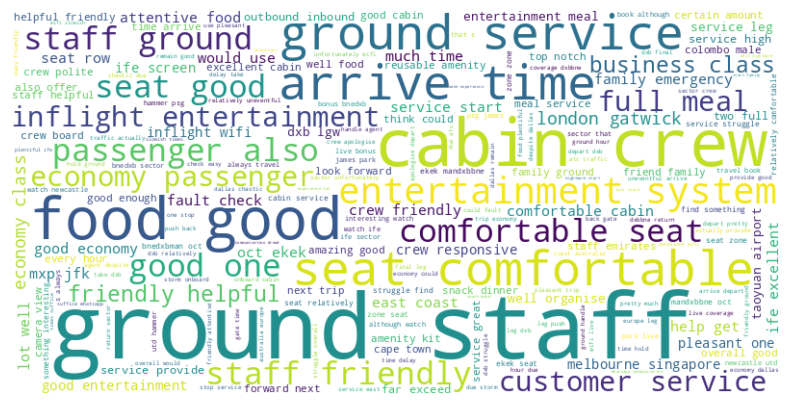

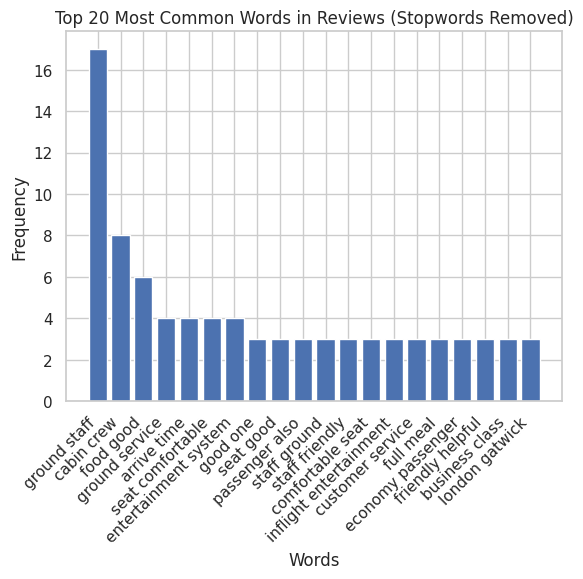

['ground staff: 17 occurrences',
 'cabin crew: 8 occurrences',
 'food good: 6 occurrences',
 'ground service: 4 occurrences',
 'arrive time: 4 occurrences',
 'seat comfortable: 4 occurrences',
 'entertainment system: 4 occurrences',
 'good one: 3 occurrences',
 'seat good: 3 occurrences',
 'passenger also: 3 occurrences',
 'staff ground: 3 occurrences',
 'staff friendly: 3 occurrences',
 'comfortable seat: 3 occurrences',
 'inflight entertainment: 3 occurrences',
 'customer service: 3 occurrences',
 'full meal: 3 occurrences',
 'economy passenger: 3 occurrences',
 'friendly helpful: 3 occurrences',
 'business class: 3 occurrences',
 'london gatwick: 3 occurrences']

In [568]:
emirates_eco_positive_high_ground_service = emirates_eco_positive[emirates_eco_positive['ground_service']>3]
n_gram_wordcloud(df_airline = emirates_eco_positive_high_ground_service,classification = "positive", n_grams=2, 
                 category="ground",cabin="Economy Class")

In [569]:
emirates_eco_positive_ground = emirates_eco_positive_high_ground_service[emirates_eco_positive_high_ground_service['final_review'].str.contains('ground')]
emirates_eco_positive_ground
pd.set_option('display.max_colwidth', None)
print(emirates_eco_positive_ground['customer_review'])

4107                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                 BNE-DXB-MAN on 4th & 5th Oct (EK435/EK017) and MAN-DXB-BNE on 19th & 20th Oct (EK020/EK434). All 4 flights in A380s, 3 in seating zone F and 1 in zone B. Seats relatively comfortable and cabin service OK but str

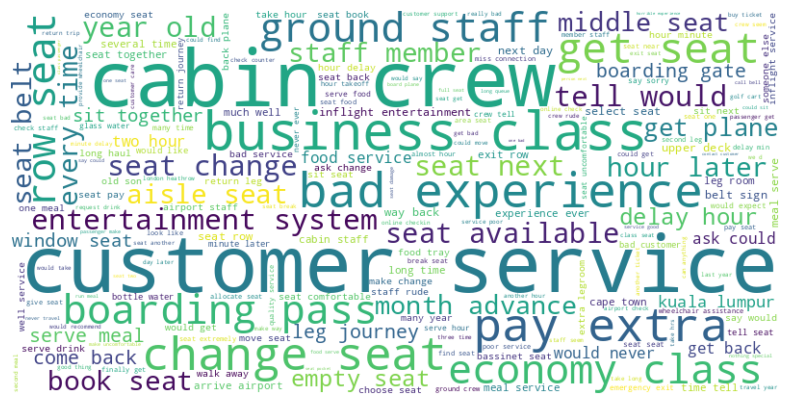

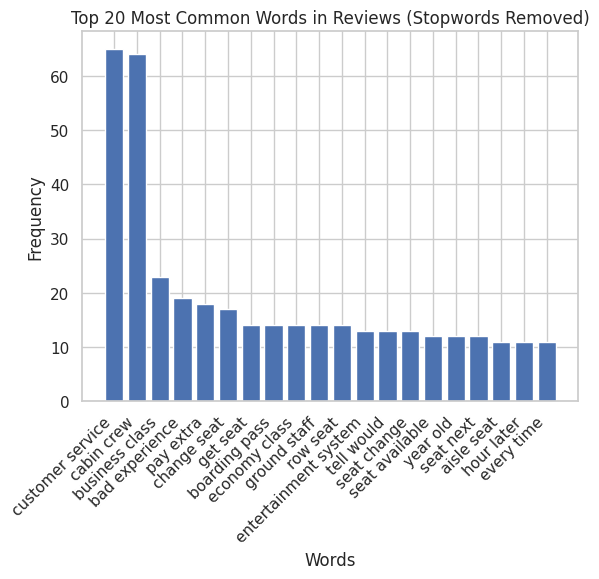

['customer service: 65 occurrences',
 'cabin crew: 64 occurrences',
 'business class: 23 occurrences',
 'bad experience: 19 occurrences',
 'pay extra: 18 occurrences',
 'change seat: 17 occurrences',
 'get seat: 14 occurrences',
 'boarding pass: 14 occurrences',
 'economy class: 14 occurrences',
 'ground staff: 14 occurrences',
 'row seat: 14 occurrences',
 'entertainment system: 13 occurrences',
 'tell would: 13 occurrences',
 'seat change: 13 occurrences',
 'seat available: 12 occurrences',
 'year old: 12 occurrences',
 'seat next: 12 occurrences',
 'aisle seat: 11 occurrences',
 'hour later: 11 occurrences',
 'every time: 11 occurrences']

In [489]:
emirates_negative = emirates_sentimens[(emirates_sentimens['label_overall'] == 'negative') & (emirates_sentimens['vader_overall_sentiment'] == 'negative')]
n_gram_wordcloud(df_airline = emirates_negative,classification = "negative", n_grams=2,
                 category="seat",cabin="Economy Class")

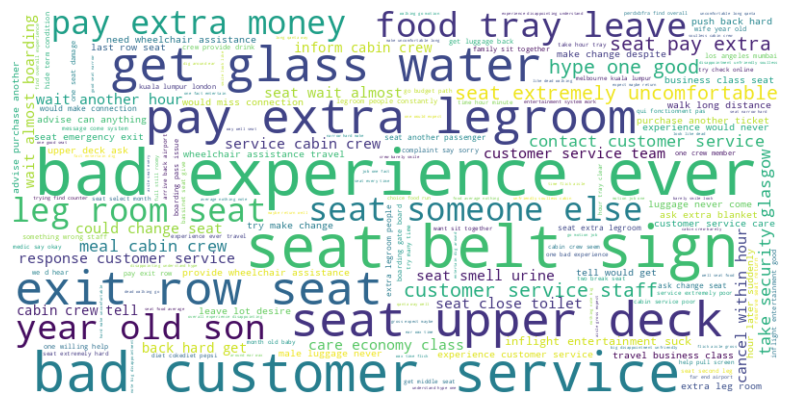

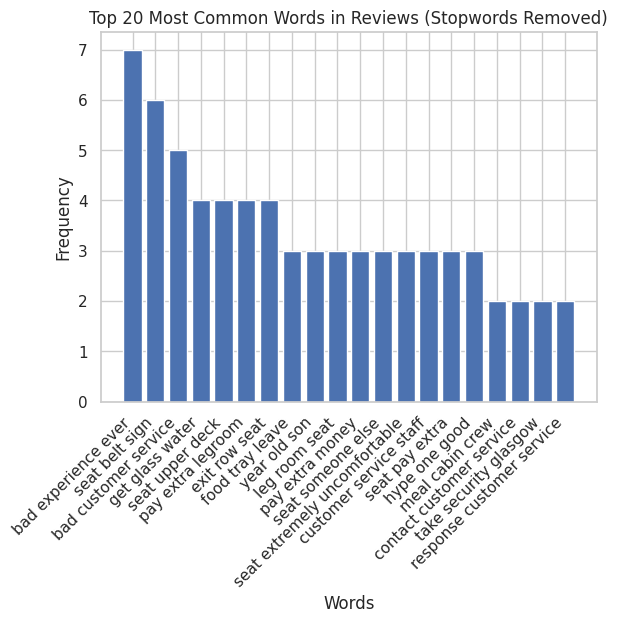

['bad experience ever: 7 occurrences',
 'seat belt sign: 6 occurrences',
 'bad customer service: 5 occurrences',
 'get glass water: 4 occurrences',
 'seat upper deck: 4 occurrences',
 'pay extra legroom: 4 occurrences',
 'exit row seat: 4 occurrences',
 'food tray leave: 3 occurrences',
 'year old son: 3 occurrences',
 'leg room seat: 3 occurrences',
 'pay extra money: 3 occurrences',
 'seat someone else: 3 occurrences',
 'seat extremely uncomfortable: 3 occurrences',
 'customer service staff: 3 occurrences',
 'seat pay extra: 3 occurrences',
 'hype one good: 3 occurrences',
 'meal cabin crew: 2 occurrences',
 'contact customer service: 2 occurrences',
 'take security glasgow: 2 occurrences',
 'response customer service: 2 occurrences']

In [500]:
emirates_negative_low_seat_comfort = emirates_negative[emirates_negative['seat_comfort']<3]
n_gram_wordcloud(df_airline = emirates_negative_low_seat_comfort,classification = "negative", n_grams=3, 
                 category="seat",cabin="Economy Class")

In [501]:
emirates_negative_low_seat_comfort = emirates_negative[emirates_negative['final_review'].str.contains('seat belt')]
emirates_negative_low_seat_comfort
pd.set_option('display.max_colwidth', None)
print(emirates_negative_low_seat_comfort['customer_review'])

4361                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

### Qatar

In [531]:
qatar_eco_positive = qatar_sentimens[(qatar_sentimens['label_overall'] == 'positive') & 
                    (qatar_sentimens['vader_overall_sentiment'] == 'positive') & (qatar_sentimens['cabin'] == 'Economy Class')]

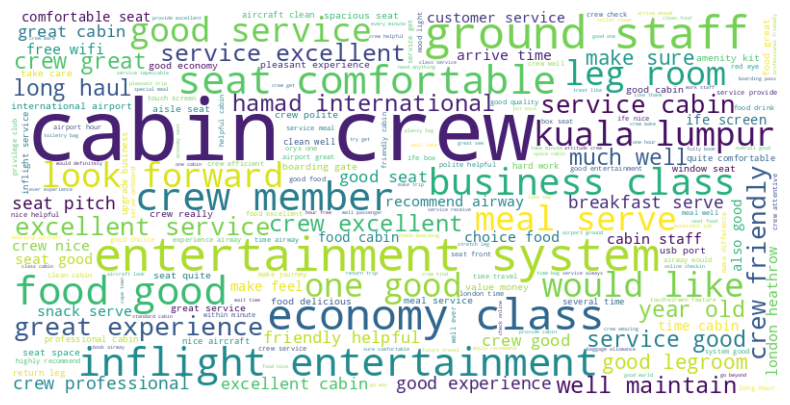

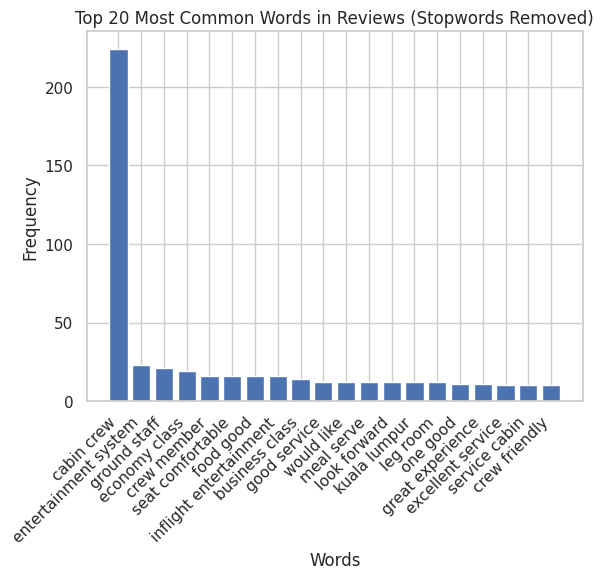

['cabin crew: 224 occurrences',
 'entertainment system: 23 occurrences',
 'ground staff: 21 occurrences',
 'economy class: 19 occurrences',
 'crew member: 16 occurrences',
 'seat comfortable: 16 occurrences',
 'food good: 16 occurrences',
 'inflight entertainment: 16 occurrences',
 'business class: 14 occurrences',
 'good service: 12 occurrences',
 'would like: 12 occurrences',
 'meal serve: 12 occurrences',
 'look forward: 12 occurrences',
 'kuala lumpur: 12 occurrences',
 'leg room: 12 occurrences',
 'one good: 11 occurrences',
 'great experience: 11 occurrences',
 'excellent service: 10 occurrences',
 'service cabin: 10 occurrences',
 'crew friendly: 10 occurrences']

In [533]:
qatar_eco_positive_high_cabin_service = qatar_eco_positive[qatar_eco_positive['cabin_service']>3]
n_gram_wordcloud(df_airline = qatar_eco_positive_high_cabin_service,classification = "positive", n_grams=2, 
                 category="cabin crew",cabin="Economy Class")

In [534]:
qatar_eco_positive_high_cabin_crew = qatar_eco_positive_high_cabin_service[qatar_eco_positive_high_cabin_service['final_review'].str.contains('cabin crew')]
qatar_eco_positive_high_cabin_crew
pd.set_option('display.max_colwidth', None)
print(qatar_eco_positive_seat_comfort['customer_review'])

1806                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

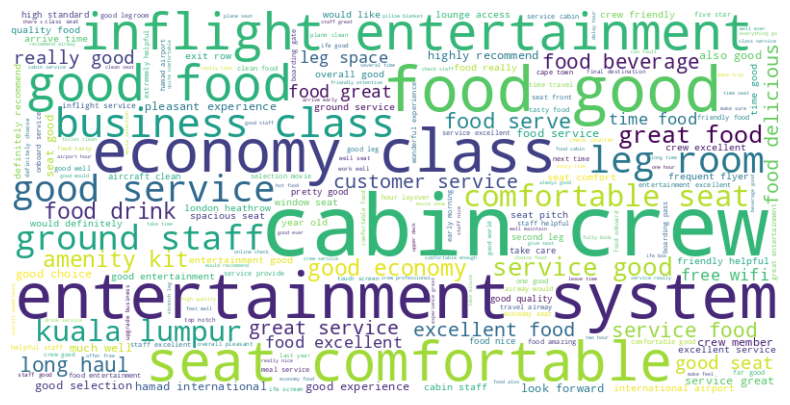

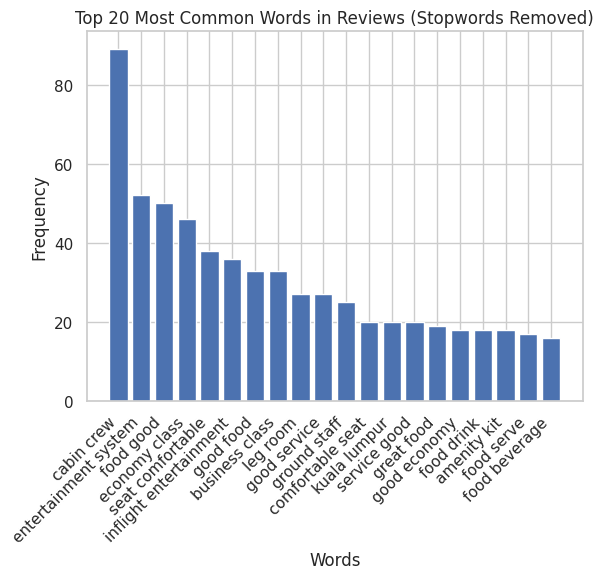

['cabin crew: 89 occurrences',
 'entertainment system: 52 occurrences',
 'food good: 50 occurrences',
 'economy class: 46 occurrences',
 'seat comfortable: 38 occurrences',
 'inflight entertainment: 36 occurrences',
 'good food: 33 occurrences',
 'business class: 33 occurrences',
 'leg room: 27 occurrences',
 'good service: 27 occurrences',
 'ground staff: 25 occurrences',
 'comfortable seat: 20 occurrences',
 'kuala lumpur: 20 occurrences',
 'service good: 20 occurrences',
 'great food: 19 occurrences',
 'good economy: 18 occurrences',
 'food drink: 18 occurrences',
 'amenity kit: 18 occurrences',
 'food serve: 17 occurrences',
 'food beverage: 16 occurrences']

In [536]:
qatar_eco_positive_high_food_bev = qatar_eco_positive[qatar_eco_positive['food_bev']>3]
n_gram_wordcloud(df_airline = qatar_eco_positive_high_food_bev,classification = "positive", n_grams=2, 
                 category="food",cabin="Economy Class")

In [537]:
qatar_eco_positive_food = qatar_eco_positive_high_food_bev[qatar_eco_positive_high_food_bev['final_review'].str.contains('food')]
qatar_eco_positive_food
pd.set_option('display.max_colwidth', None)
print(qatar_eco_positive_food['customer_review'])

1752                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

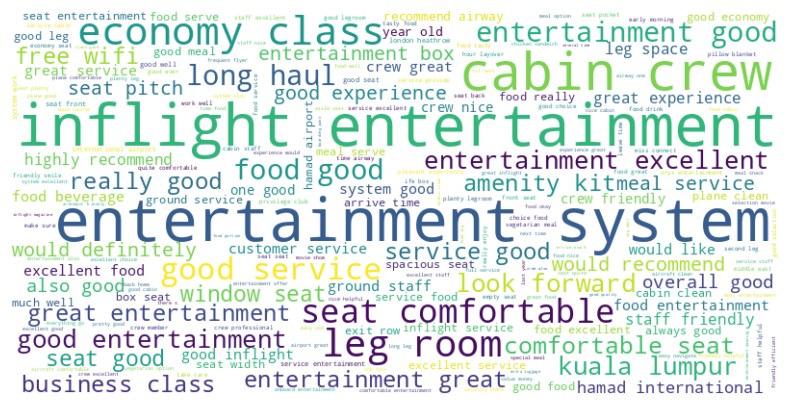

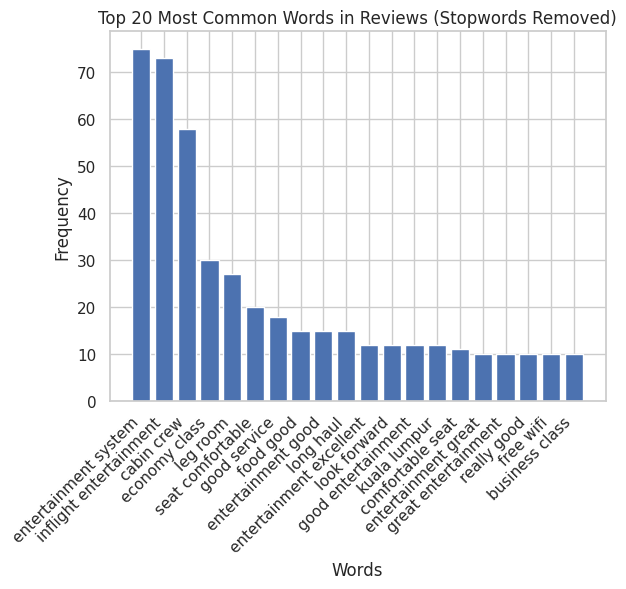

['entertainment system: 75 occurrences',
 'inflight entertainment: 73 occurrences',
 'cabin crew: 58 occurrences',
 'economy class: 30 occurrences',
 'leg room: 27 occurrences',
 'seat comfortable: 20 occurrences',
 'good service: 18 occurrences',
 'food good: 15 occurrences',
 'entertainment good: 15 occurrences',
 'long haul: 15 occurrences',
 'entertainment excellent: 12 occurrences',
 'look forward: 12 occurrences',
 'good entertainment: 12 occurrences',
 'kuala lumpur: 12 occurrences',
 'comfortable seat: 11 occurrences',
 'entertainment great: 10 occurrences',
 'great entertainment: 10 occurrences',
 'really good: 10 occurrences',
 'free wifi: 10 occurrences',
 'business class: 10 occurrences']

In [539]:
qatar_eco_positive_high_entertainment = qatar_eco_positive[qatar_eco_positive['entertainment']>3]
n_gram_wordcloud(df_airline = qatar_eco_positive_high_entertainment,classification = "positive", n_grams=2, 
                 category="entertainment",cabin="Economy Class")

In [540]:
qatar_eco_positive_entertainment = qatar_eco_positive_high_entertainment[qatar_eco_positive_high_entertainment['final_review'].str.contains('entertainment system')]
qatar_eco_positive_entertainment
pd.set_option('display.max_colwidth', None)
print(qatar_eco_positive_entertainment['customer_review'])

1918                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

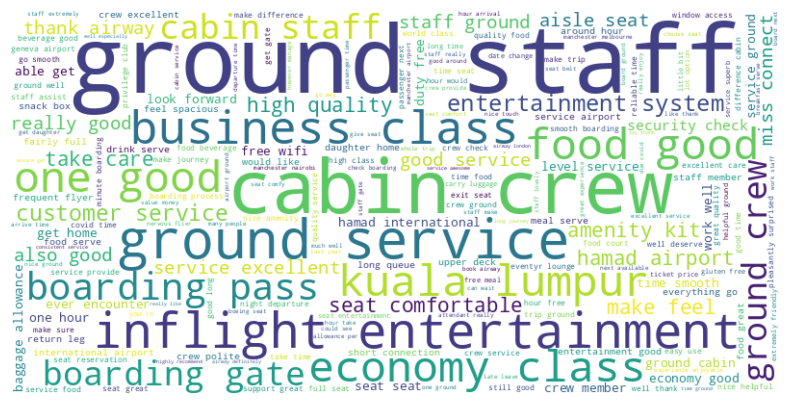

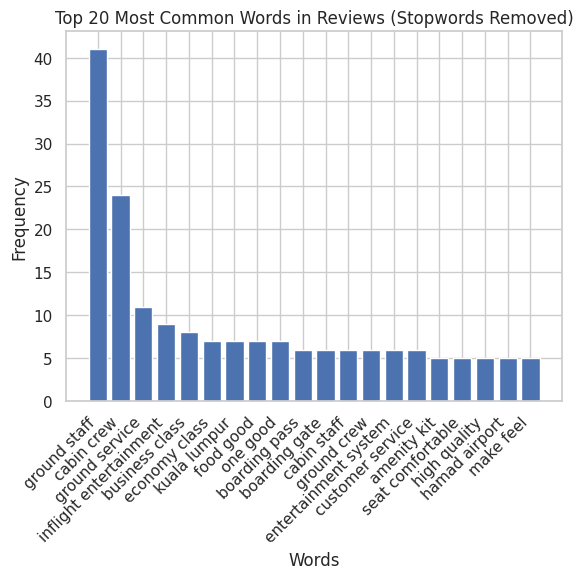

['ground staff: 41 occurrences',
 'cabin crew: 24 occurrences',
 'ground service: 11 occurrences',
 'inflight entertainment: 9 occurrences',
 'business class: 8 occurrences',
 'economy class: 7 occurrences',
 'kuala lumpur: 7 occurrences',
 'food good: 7 occurrences',
 'one good: 7 occurrences',
 'boarding pass: 6 occurrences',
 'boarding gate: 6 occurrences',
 'cabin staff: 6 occurrences',
 'ground crew: 6 occurrences',
 'entertainment system: 6 occurrences',
 'customer service: 6 occurrences',
 'amenity kit: 5 occurrences',
 'seat comfortable: 5 occurrences',
 'high quality: 5 occurrences',
 'hamad airport: 5 occurrences',
 'make feel: 5 occurrences']

In [541]:
qatar_eco_positive_high_ground_service = qatar_eco_positive[qatar_eco_positive['ground_service']>3]
n_gram_wordcloud(df_airline = qatar_eco_positive_high_ground_service,classification = "positive", n_grams=2, 
                 category="ground",cabin="Economy Class")

In [542]:
qatar_eco_positive_ground_staff = qatar_eco_positive_high_entertainment[qatar_eco_positive_high_entertainment['final_review']
                                                                         .str.contains('ground staff')]
qatar_eco_positive_ground_staff
pd.set_option('display.max_colwidth', None)
print(qatar_eco_positive_ground_staff['customer_review'])

1829                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    